In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version



nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
!pip list

Package                       Version
----------------------------- ---------------------
absl-py                       1.0.0
alabaster                     0.7.12
albumentations                0.1.12
altair                        4.2.0
appdirs                       1.4.4
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arviz                         0.12.0
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
atari-py                      0.2.9
atomicwrites                  1.4.0
attrs                         21.4.0
audioread                     2.1.9
autograd                      1.4
Babel                         2.10.1
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.0
blis                          0.4.1
bokeh                         2.3.3
Bottleneck                    1.3.4
branca                        0.5.0
bs4                           0.0.1
Cache

In [ ]:
!curl -L "https://public.roboflow.com/ds/Zm5t6M7eD7?key=jsQETCsUJe" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   880  100   880    0     0   2004      0 --:--:-- --:--:-- --:--:--  2000
100 11.6M  100 11.6M    0     0  18.1M      0 --:--:-- --:--:-- --:--:-- 18.1M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: export/
 extracting: export/_annotations.coco.json  
 extracting: export/raccoon-100_jpg.rf.YWIftfgUdZqJLTkvI9W2.jpg  
 extracting: export/raccoon-101_jpg.rf.ebfr15yC06H7KdSNWJkC.jpg  
 extracting: export/raccoon-102_jpg.rf.Vtizg4N4D1Wn9fv4sBaJ.jpg  
 extracting: export/raccoon-103_jpg.rf.yx4ScGFA2FZ23qfitAfV.jpg  
 extracting: export/raccoon-104_jpg.rf.HdpZVmq1teO4b2ny0HJO.jpg  
 extracting: export/raccoon-105_jpg.rf.S4P0w34qeFrLIhNIHmuD.jpg  
 extracting: export/raccoon-106_jpg.rf.UCuMtEoBFF5lvbYSErKC.jpg  
 extracting: export/raccoon-107_jpg.rf.pQbBB9zNruyNhePH5B

In [ ]:
# install dependencies: (use cu113 because colab has CUDA 11.3)
!pip install torch==1.11.0+cu113 torchvision==0.12.0+cu113-f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu113/torch1.11.0/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

     |████████████████████████████████| 321 kB 3.8 MB/s 
  ERROR: Cannot unpack file /tmp/pip-unpack-cci9_4ec/torch_stable.html (downloaded from /tmp/pip-req-build-xp_qqlsk, content-type: text/html); cannot detect archive format
ERROR: Cannot determine archive format of /tmp/pip-req-build-xp_qqlsk
Looking in links: https://download.openmmlab.com/mmcv/dist/cu113/torch1.11.0/index.html
     |████████████████████████████████| 37.5 MB 17.0 MB/s 
     |████████████████████████████████| 190 kB 5.3 MB/s 
Cloning into 'mmdetection'...
remote: Enumerating objects: 24334, done.
remote: Total 24334 (delta 0), reused 0 (delta 0), pack-reused 24334
Receiving objects: 100% (24334/24334), 37.48 MiB | 26.89 MiB/s, done.
Resolving deltas: 100% (17021/17021), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Running setup.py develop for mmdet


In [ ]:
from mmcv import collect_env
collect_env()



{'CUDA available': True,
 'CUDA_HOME': '/usr/local/cuda',
 'GCC': 'x86_64-linux-gnu-gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0',
 'GPU 0': 'Tesla K80',
 'MMCV': '1.5.0',
 'MMCV CUDA Compiler': '11.3',
 'MMCV Compiler': 'GCC 7.3',
 'NVCC': 'Cuda compilation tools, release 11.1, V11.1.105',
 'OpenCV': '4.1.2',
 'PyTorch': '1.11.0+cu113',
 'PyTorch compiling details': 'PyTorch built with:\n  - GCC 7.3\n  - C++ Version: 201402\n  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications\n  - Intel(R) MKL-DNN v2.5.2 (Git Hash a9302535553c73243c632ad3c4c80beec3d19a1e)\n  - OpenMP 201511 (a.k.a. OpenMP 4.5)\n  - LAPACK is enabled (usually provided by MKL)\n  - NNPACK is enabled\n  - CPU capability usage: AVX2\n  - CUDA Runtime 11.3\n  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-ge

In [ ]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.11.0+cu113 True
2.24.1
11.3
GCC 7.3


In [ ]:
# pre-trained checkpoints
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


--2022-05-05 10:24:22--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.28
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.28|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’

checkpoints/faster_ 100%[===================>] 159.54M  9.50MB/s    in 17s     

2022-05-05 10:24:40 (9.49 MB/s) - ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’ saved [167291982/167291982]



In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()


load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

In [ ]:
# Use the detector to do inference
img = 'demo/demo.jpg'
result = inference_detector(model, img)



/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


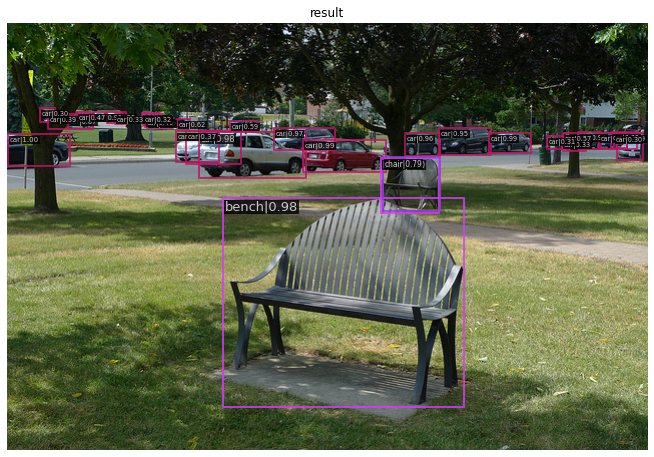

In [ ]:
# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.3)

## Now, time for raccoons from roboflow

In [ ]:
# Install tree first
!apt-get -q install tree
!tree /content/raccoons


Reading package lists...
Building dependency tree...
Reading state information...
The following packages were automatically installed and are no longer required:
  libnvidia-common-460 nsight-compute-2020.2.0
Use 'apt autoremove' to remove them.
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 42 not upgraded.
Need to get 40.7 kB of archives.
After this operation, 105 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tree amd64 1.7.0-5 [40.7 kB]
Fetched 40.7 kB in 0s (85.2 kB/s)
Selecting previously unselected package tree.
(Reading database ... 155203 files and directories currently installed.)
Preparing to unpack .../tree_1.7.0-5_amd64.deb ...
Unpacking tree (1.7.0-5) ...
Setting up tree (1.7.0-5) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
/content/raccoons [error opening dir]

0 directories, 0 files


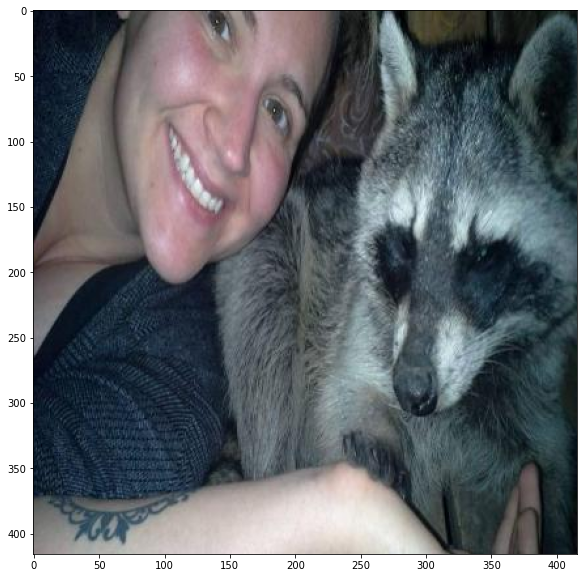

In [ ]:
# Let's take a look at the dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('/content/train/raccoon-100_jpg.rf.e9338202a924dc489ffd94e0291a0f39.jpg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()



In [ ]:
import json
path = "/content/train/_annotations.coco.json"
f = open(path)
anns = json.load(f)
print(anns.keys())

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])


In [ ]:
from pycocotools.coco import COCO

ann_file = "/content/train/_annotations.coco.json"
coco=COCO(ann_file)
category_ids = coco.getCatIds(['raccoon'])

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
category_ids

[1]

In [ ]:
image_ids = coco.getImgIds(catIds=[1])
print(image_ids[0:5])

[0, 1, 2, 3, 4]


## Won't be using COCO API


In [ ]:
# import copy
# import os.path as osp

# import mmcv
# import numpy as np

# from mmdet.datasets.builder import DATASETS
# from mmdet.datasets.custom import CustomDataset

# @DATASETS.register_module()
# class RaccoonDataset(CustomDataset):

#     CLASSES = ('Raccoon')

#     def load_annotations(self, ann_file):
#         cat2label = {k: i for i, k in enumerate(self.CLASSES)}
#         # load image list from file
#         image_list = mmcv.list_from_file(self.ann_file)
    
#         data_infos = []
#         # convert annotations to middle format
#         for image_id in image_list:
#             filename = f'{self.img_prefix}/{image_id}.jpeg'
#             image = mmcv.imread(filename)
#             height, width = image.shape[:2]
    
#             data_info = dict(filename=f'{image_id}.jpeg', width=width, height=height)
    
#             # load annotations
#             label_prefix = self.img_prefix.replace('image_2', 'label_2')
#             lines = mmcv.list_from_file(osp.join(label_prefix, f'{image_id}.txt'))
    
#             content = [line.strip().split(' ') for line in lines]
#             bbox_names = [x[0] for x in content]
#             bboxes = [[float(info) for info in x[4:8]] for x in content]
    
#             gt_bboxes = []
#             gt_labels = []
#             gt_bboxes_ignore = []
#             gt_labels_ignore = []
    
#             # filter 'DontCare'
#             for bbox_name, bbox in zip(bbox_names, bboxes):
#                 if bbox_name in cat2label:
#                     gt_labels.append(cat2label[bbox_name])
#                     gt_bboxes.append(bbox)
#                 else:
#                     gt_labels_ignore.append(-1)нФ
#                     gt_bboxes_ignore.append(bbox)

#             data_anno = dict(
#                 bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
#                 labels=np.array(gt_labels, dtype=np.long),
#                 bboxes_ignore=np.array(gt_bboxes_ignore,
#                                        dtype=np.float32).reshape(-1, 4),
#                 labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

#             data_info.update(ann=data_anno)
#             data_infos.append(data_info)

#         return data_infos

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py')


In [ ]:
cfg

Config (path: ./configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py): {'model': {'type': 'FasterRCNN', 'backbone': {'type': 'ResNet', 'depth': 50, 'num_stages': 4, 'out_indices': (0, 1, 2, 3), 'frozen_stages': 1, 'norm_cfg': {'type': 'BN', 'requires_grad': False}, 'norm_eval': True, 'style': 'caffe', 'init_cfg': {'type': 'Pretrained', 'checkpoint': 'open-mmlab://detectron2/resnet50_caffe'}}, 'neck': {'type': 'FPN', 'in_channels': [256, 512, 1024, 2048], 'out_channels': 256, 'num_outs': 5}, 'rpn_head': {'type': 'RPNHead', 'in_channels': 256, 'feat_channels': 256, 'anchor_generator': {'type': 'AnchorGenerator', 'scales': [8], 'ratios': [0.5, 1.0, 2.0], 'strides': [4, 8, 16, 32, 64]}, 'bbox_coder': {'type': 'DeltaXYWHBBoxCoder', 'target_means': [0.0, 0.0, 0.0, 0.0], 'target_stds': [1.0, 1.0, 1.0, 1.0]}, 'loss_cls': {'type': 'CrossEntropyLoss', 'use_sigmoid': True, 'loss_weight': 1.0}, 'loss_bbox': {'type': 'L1Loss', 'loss_weight': 1.0}}, 'roi_head': {'type': 'StandardRoIHead'

In [ ]:
from mmdet.apis import set_random_seed
# Modify dataset type and path
cfg.dataset_type = 'CocoDataset'
cfg.data_root = '/content/'
cfg.device = 'cuda'

cfg.data.test.type = 'CocoDataset'
cfg.data.test.classes = ('raccoons', 'raccoon',)
cfg.data.test.data_root = '/content/test/'
cfg.data.test.ann_file = '_annotations.coco.json'
cfg.data.test.img_prefix = ''

cfg.data.train.type = 'CocoDataset'
cfg.data.train.classes = ('raccoons', 'raccoon',)
cfg.data.train.data_root = '/content/train/'
cfg.data.train.ann_file = '_annotations.coco.json'
cfg.data.train.img_prefix = ''

cfg.data.val.type = 'CocoDataset'
cfg.data.val.classes = ('raccoons', 'raccoon',)
cfg.data.val.data_root = '/content/valid/'
cfg.data.val.ann_file = '_annotations.coco.json'
cfg.data.val.img_prefix = ''

# modify num classes of the model in box head 
cfg.model.roi_head.bbox_head.num_classes = 2
# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/logs_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None


# evaluation metric
cfg.evaluation.metric = 'bbox'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.interval = 10
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]


# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='FasterRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cro

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import os.path as osp



# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# for visualization convenience
model.CLASSES = datasets[0].CLASSES
# print(datasets[0].CLASSES)

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)



loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2022-05-05 10:59:45,003 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-05-05 10:59:45,017 - mmdet - INFO - load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


2022-05-05 10:59:45,240 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([3]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([8, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([8]).
2022-05-05 10:59:45,259 - mmdet - INFO - Start running, host: root@14c07dc7cc5e, work_dir: /content/logs_exps
2022-05-05 10:59:45,262 - mmdet - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) StepLrUpdaterHo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 29/29, 3.4 task/s, elapsed: 8s, ETA:     0s

2022-05-05 11:15:30,524 - mmdet - INFO - Evaluating bbox...
2022-05-05 11:15:30,567 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.939
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.839
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.691
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.741
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.741
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.741
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = -1.000
 Avera

Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).


loss_cls: Classification loss in the ROI head. Measures the loss for box classification, i.e., how good the model is at labelling a predicted box with the correct class.  
loss_box_reg: Localisation loss in the ROI head. Measures the loss for box localisation (predicted location vs true location).  
loss_rpn_cls: Classification loss in the Region Proposal Network. Measures the "objectness" loss, i.e., how good the RPN is at labelling the anchor boxes as foreground or background.  


/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


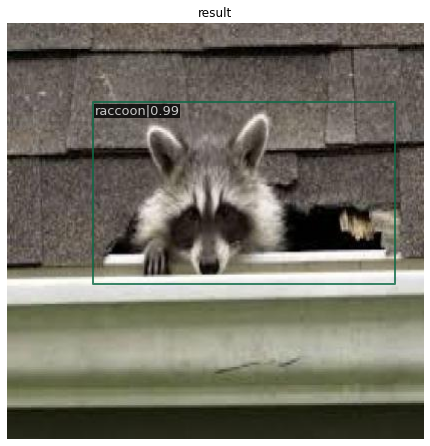

In [ ]:
img = mmcv.imread('/content/test/raccoon-60_jpg.rf.cff8b797e6b5c9b716b6be70be2b6b33.jpg')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)



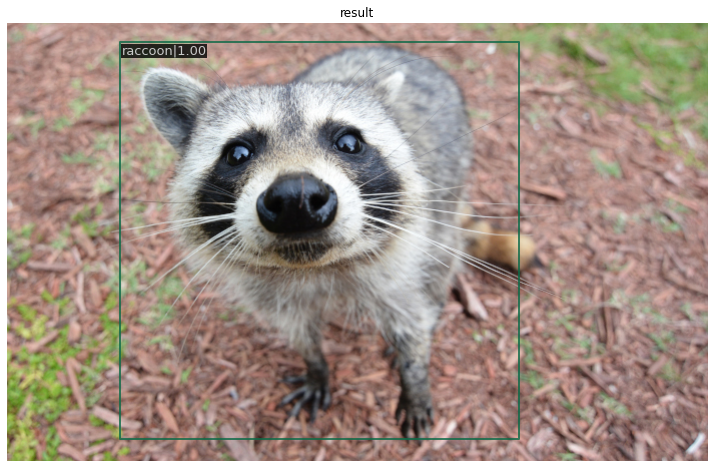

In [ ]:
img2 = mmcv.imread('/content/test/enot.jpeg')
result = inference_detector(model, img2)
show_result_pyplot(model, img2, result)

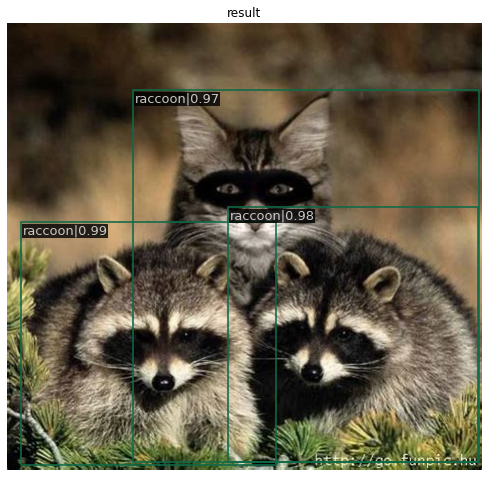

In [ ]:
img3 = mmcv.imread('/content/test/trap.jpeg')
result = inference_detector(model, img3)
show_result_pyplot(model, img3, result)

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import tensorflow as tf
import datetime

In [ ]:
%tensorboard --logdir /content/logs_exps/tf_logs

<IPython.core.display.Javascript object>